In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive', force_remount=True)


Mounted at /content/drive


Something is happening before the function is called.
Hello!
Something is happening after the function is called.


In [ ]:
#Uncomment to create directory. Not needed if using the folder I shared.
# !mkdir /content/drive/MyDrive/UCC-AI-hackathon

In [ ]:
%%capture
!pip install cloud-tpu-client https://storage.googleapis.com/tpu-pytorch/wheels/torch_xla-1.13-cp38-cp38m-linux_x86_64.whl
!pip install lightning albumentations matplotlib
#Uncomment if not done already. This clones to drive. Again, this has been done to the drive I shared. So not needed
# !git clone https://github.com/ReML-AI/ucc-ai-quest-baseline.git /content/drive/MyDrive/UCC-AI-hackathon

#Uncomment to clone to /content
# !git clone https://github.com/ReML-AI/ucc-ai-quest-baseline.git baseline



In [ ]:
%%capture
!unzip -n /content/drive/MyDrive/UCC-AI-hackathon/data/public.zip   #change path accordingly to the path to the folder shared (on your drive)
!unzip -n /content/drive/MyDrive/UCC-AI-hackathon/data/warmup.zip
# !unzip -n ./baseline/data/warmup.zip


In [ ]:
!unzip -n /content/drive/MyDrive/UCC-AI-hackathon/PrivateTest/private.zip

Archive:  /content/drive/MyDrive/UCC-AI-hackathon/PrivateTest/private.zip
   creating: private/
  inflating: __MACOSX/._private      
  inflating: private/.DS_Store       
  inflating: __MACOSX/private/._.DS_Store  
   creating: private/img/
  inflating: __MACOSX/private/._img  
  inflating: private/img/.DS_Store   
  inflating: __MACOSX/private/img/._.DS_Store  
   creating: private/img/test/
  inflating: __MACOSX/private/img/._test  
  inflating: private/img/test/66c81e5938d8648934776ed8fa2fdf1f.jpg  
  inflating: __MACOSX/private/img/test/._66c81e5938d8648934776ed8fa2fdf1f.jpg  
  inflating: private/img/test/7c92109e1bf8758084e4a50700327254.jpg  
  inflating: __MACOSX/private/img/test/._7c92109e1bf8758084e4a50700327254.jpg  
  inflating: private/img/test/3ec60e6b8b3f48261966e7ca6881195d.jpg  
  inflating: __MACOSX/private/img/test/._3ec60e6b8b3f48261966e7ca6881195d.jpg  
  inflating: private/img/test/b6b18e022c136c239887b31eccb4f52c.jpg  
  inflating: __MACOSX/private/img/test/._b6b

In [ ]:
%%capture
# !unzip -n /content/drive/MyDrive/public.zip

In [ ]:
# !cp /content/drive/MyDrive/public.zip /content/drive/MyDrive/UCC-AI-hackathon/data/

In [ ]:
# %cd /content

In [ ]:
%%capture
!pip install wandb -qU

In [ ]:
import wandb
wandb.login(key = "016db697fab5722624dda350c3b851008f2af0cc")

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
import sys
sys.path.append('/content/drive/MyDrive/UCC-AI-hackathon') #change to path of the folder
# sys.path.append('./baseline')



In [ ]:
%%capture
!pip install segmentation-models-pytorch


In [ ]:
# !pip install colorama

In [ ]:
import os
import torch
import json
# import wandb
import random
import lightning.pytorch as pl
from tqdm import tqdm
from pathlib import Path
from PIL import Image, ImageFilter
import numpy as np
import cv2
# from colorama import Fore
import albumentations.pytorch as pytorch
from albumentations.pytorch import ToTensorV2
import albumentations as A
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning import seed_everything
from datasets import SegDataModule, SegDataset, SegDatasetTest
from models import SegModel
from utils import mask_to_rle, show_in_grid, mask_to_rgb
from metrics import SMAPIoUMetric
from lightning.pytorch.callbacks.early_stopping import EarlyStopping

In [ ]:
seed_everything(2023)

In [ ]:
# import numpy as np
# mask = np.array([1,2,3,4])
# mask_red = np.zeros_like(mask)
# mask_red[mask == 2]= 10
# mask_red

### Example of random images and corresponding masks from the dataset

Load some random images and corresponding masks

In [ ]:
# IMG_DIR = Path("./warmup/img/train/")
# VAL_DIR = Path("./warmup/img/valid/")
# ANN_DIR = Path("./warmup/ann/train/")

IMG_DIR = Path("./public/img/train/")
VAL_DIR = Path("./public/img/valid/")
ANN_DIR = Path("./public/ann/train/")

imgs = [IMG_DIR / i for i in random.sample(os.listdir(IMG_DIR), 5)]
anns = [ANN_DIR / f"{Path(img).stem}.png" for img in imgs]

imgs = [Image.open(img) for img in imgs]
anns = [mask_to_rgb(Image.open(ann), {1: [55, 125, 34]}) for ann in anns] # convert label 1 to green (55, 125, 34)
imgs.extend(anns)

In [ ]:
# !pip install easyimages

In [ ]:
# IMG_DIR = Path("./warmup/img/train/")
# VAL_DIR = Path("./warmup/img/valid/")
# ANN_DIR = Path("./warmup/ann/train/")

# imgs = [IMG_DIR / i for i in random.sample(os.listdir(IMG_DIR), 5)]
# anns = [ANN_DIR / f"{Path(img).stem}.png" for img in imgs]


In [ ]:
# imgs

In [ ]:
# import cv2
# import numpy as np
# import matplotlib.pyplot as plt

# # Load the image
# image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

# # Calculate the histogram
# histogram = cv2.calcHist([image], [0], None, [256], [0, 256])

# # Plot the histogram
# plt.plot(histogram)
# plt.title('Histogram of the Image')
# plt.xlabel('Pixel Value')
# plt.ylabel('Frequency')
# plt.show()


In [ ]:
# # Load the image
# image = cv2.imread('your_image.jpg')

# # Step 1: Convert to HSV
# image_hsv = convert_to_hsv(image)

# # Step 2: Filter high vegetation
# vegetation_mask = filter_high_vegetation(image_hsv)

# # Step 3: Apply the mask to the original image
# result_image = apply_mask(image, vegetation_mask)

# # Step 4: Optional additional processing
# result_image = image_processing(result_image)

# # Display the result
# cv2.imshow('Result', result_image)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


In [ ]:
# from easyimages import EasyImageList
# Li = EasyImageList.from_folder("./warmup/img/train/")
# Li.symlink_images()
# Li.html(sample =200, size=44)

In [ ]:
# imgs = [IMG_DIR / i for i in os.listdir(IMG_DIR)]

Average Class Imbalance Ratios: [0.50799163 0.49200837]


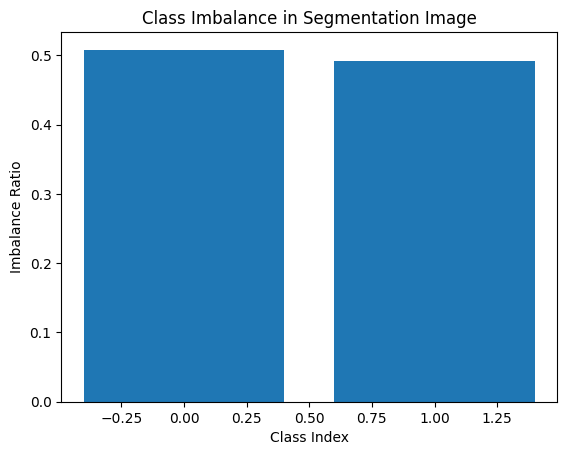

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def calculate_class_imbalance(mask, num_classes):
    """
    Calculate class imbalance in a segmentation mask.

    Args:
        mask (numpy.ndarray): Segmentation mask.
        num_classes (int): Number of classes in the segmentation task.

    Returns:
        list: Class imbalance ratios for each class.
    """
    # Initialize class counts
    class_counts = np.zeros(num_classes)

    # Flatten the mask and update class counts
    unique_labels, label_counts = np.unique(mask, return_counts=True)

    # assert num_classes == len(unique_labels)
    # print(len(unique_labels))
    for label, count in zip(unique_labels, label_counts):
        class_counts[label] += count

    # Calculate class imbalance ratios
    total_pixels = sum(class_counts)
    class_imbalance_ratios = class_counts / total_pixels

    return class_imbalance_ratios

def process_dataset(mask_dir, img_dir, num_classes):
    """
    Process a segmentation dataset and calculate class imbalance for each image.

    Args:
        dataset_paths (list): List of paths to segmentation masks.
        num_classes (int): Number of classes in the segmentation task.

    Returns:
        list: List of class imbalance ratios for each image.
    """
    imbalance_ratios_per_image = []

    imgs = [img_dir / i for i in os.listdir(IMG_DIR)]
    anns = [mask_dir / f"{Path(img).stem}.png" for img in imgs]

    # Iterate over the dataset and calculate class counts
    for ann in anns:
        # Load the segmentation mask
        # mask_path = dataset_path[i]  # Replace with your dataset path
        mask = np.array(Image.open(ann))
        imbalance_ratios = calculate_class_imbalance(mask, num_classes)
        imbalance_ratios_per_image.append(imbalance_ratios)

    return imbalance_ratios_per_image

# Example usage:
mask_path = ANN_DIR  # Replace with your dataset path
img_path = IMG_DIR
num_classes = 2  # Replace with the actual number of classes in your segmentation task


imbalance_ratios_per_image = process_dataset(mask_path, img_path, num_classes)

# # Display the class imbalance ratios for each image
# for image_idx, ratios in enumerate(imbalance_ratios_per_image):
#     print(f"Image {image_idx + 1}: Class Imbalance Ratios = {ratios}")

# Optionally, average the class imbalance ratios across all images
average_imbalance_ratios = np.mean(imbalance_ratios_per_image, axis=0)
print("Average Class Imbalance Ratios:", average_imbalance_ratios)

# Visualize class imbalance for the first image (optional)
plt.bar(range(num_classes), average_imbalance_ratios)
plt.xlabel('Class Index')
plt.ylabel('Imbalance Ratio')
plt.title('Class Imbalance in Segmentation Image')
plt.show()


Class 0: Imbalance Ratio = 0.5111
Class 1: Imbalance Ratio = 0.4889


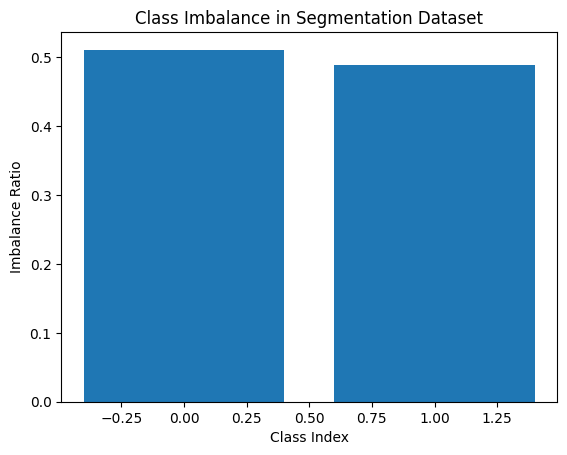

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def calculate_class_imbalance(mask_dir, img_dir, num_classes):
    """
    Calculate class imbalance in a segmentation dataset.

    Args:
        dataset_path (str): Path to the dataset containing segmentation masks.
        num_classes (int): Number of classes in the segmentation task.

    Returns:
        list: Class imbalance ratios for each class.
    """
    # Initialize class counts
    class_counts = np.zeros(num_classes)
    imgs = [IMG_DIR / i for i in os.listdir(IMG_DIR)]
    anns = [mask_dir / f"{Path(img).stem}.png" for img in imgs]

    # Iterate over the dataset and calculate class counts
    for ann in anns:
        # Load the segmentation mask
        # mask_path = dataset_path[i]  # Replace with your dataset path
        mask = np.array(Image.open(ann))
        # mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Flatten the mask and update class counts
        unique_labels, label_counts = np.unique(mask, return_counts=True)
        for label, count in zip(unique_labels, label_counts):
            class_counts[label] += count


    # Calculate class imbalance ratios
    total_pixels = sum(class_counts)
    class_imbalance_ratios = class_counts / total_pixels

    return class_imbalance_ratios

# Example usage:
mask_path = ANN_DIR  # Replace with your dataset path
img_path = IMG_DIR
num_classes = 2  # Replace with the actual number of classes in your segmentation task

imbalance_ratios = calculate_class_imbalance(mask_path, img_path, num_classes)

# Display the class imbalance ratios
for class_idx, ratio in enumerate(imbalance_ratios):
    print(f"Class {class_idx}: Imbalance Ratio = {ratio:.4f}")

# Visualize class imbalance (optional)
plt.bar(range(num_classes), imbalance_ratios)
plt.xlabel('Class Index')
plt.ylabel('Imbalance Ratio')
plt.title('Class Imbalance in Segmentation Dataset')
plt.show()


In [ ]:
#Amount of training data
len(os.listdir(IMG_DIR))

4322

In [ ]:
len(os.listdir(VAL_DIR))

689

Display images in the first row and the corresponding masks in the second row

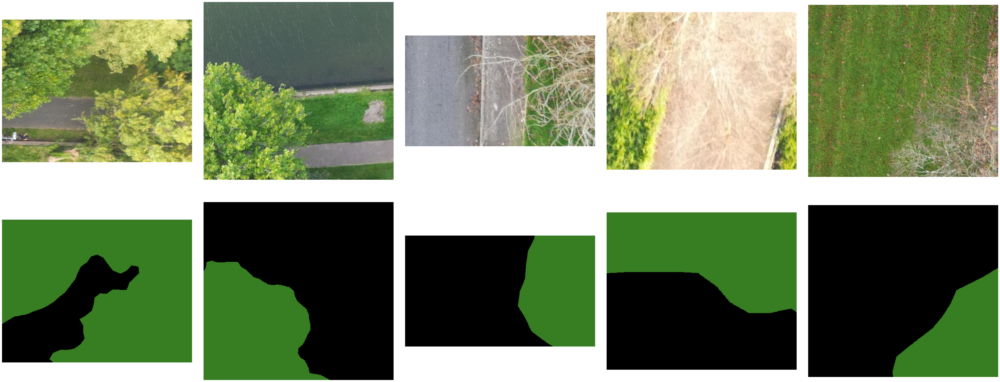

In [ ]:
show_in_grid(imgs, num_rows=2, num_cols=int(len(imgs) / 2), show_plot=True)

In [ ]:
#initialize parameters
epochs = 1
learning_rate = 1e-3
# learning_rate = 0.01
batch_size = 8

### Data Augmentations

In [ ]:
# transform = A.Compose([
#             A.Resize(380, 380),
#             # A.RandomRotate90(p=0.5),
#             A.HorizontalFlip(p=0.5),
#             A.VerticalFlip(p=0.5),
#             # A.PadIfNeeded(min_height=380, min_width=380, always_apply=True, border_mode=0),
#             # A.RandomBrightnessContrast(p=0.2),
#             # A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
#             # A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
#             ToTensorV2(),
#         ])

In [ ]:
#ref: https://towardsdatascience.com/building-a-custom-semantic-segmentation-model-abb0843ac12d

transform = A.Compose([
        A.Resize(380, 380),
        A.HorizontalFlip(p=0.5),
        A.ShiftScaleRotate(scale_limit=0.2, rotate_limit=20, shift_limit=0.2, p=0.8, border_mode=0),
        # A.PadIfNeeded(min_height=320, min_width=320, always_apply=True, border_mode=0),
        A.RandomCrop(height=300, width=300, always_apply=True),
        A.Perspective(p=0.5),
        A.OneOf(
            [
                A.CLAHE(p=1),
                A.RandomBrightness(p=1),
                A.RandomGamma(p=1),
            ],
            p=0.9,
        ),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        # A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2()
       ])

/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1258: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


In [ ]:
#ref: https://towardsdatascience.com/building-a-custom-semantic-segmentation-model-abb0843ac12d
def get_training_augmentation():
    train_transform = [
        A.HorizontalFlip(p=0.5),
        A.ShiftScaleRotate(scale_limit=0.2, rotate_limit=20, shift_limit=0.2, p=0.8, border_mode=0),
        A.PadIfNeeded(min_height=320, min_width=320, always_apply=True, border_mode=0),
        A.RandomCrop(height=320, width=320, always_apply=True),
        A.IAAAdditiveGaussianNoise(p=0.1),
        A.IAAPerspective(p=0.5),
        A.OneOf(
            [
                A.CLAHE(p=1),
                A.RandomBrightness(p=1),
                A.RandomGamma(p=1),
            ],
            p=0.9,
        )
    ]

    return A.Compose(train_transform)

In [ ]:
# #Reference: https://www.kaggle.com/code/mersico/segmentation-with-pytorch-lightning




### Create datamodule object

In [ ]:
# datamodule = SegDataModule(root_dir=".", phase="warmup", batch_size=batch_size, transform = transform)
datamodule = SegDataModule(root_dir=".", phase="public", batch_size=batch_size, transform = transform)

### Create a segmentation model object

In [ ]:
#This has been updated in model.py
model = SegModel(learning_rate = learning_rate)

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:00<00:00, 203MB/s]


Weight and Biases

In [ ]:
#Initialize
wandb.init(project="UCC-AI-hackathon",
           config={
            "epochs": epochs,
            "batch_size": batch_size,
            "lr": learning_rate,
            })

wandb: Currently logged in as: dara7 (oluwadara7). Use `wandb login --relogin` to force relogin


Setup Weights and Biases Logger

In [ ]:
# wandb.finish()
wandb_logger = pl.loggers.WandbLogger()

### Create a trainer object

In [ ]:
early_stopping_callback = early_stop_callback = EarlyStopping(monitor= "val_loss", patience=7, mode ="min")

checkpoint_callback = ModelCheckpoint(
        dirpath="checkpoints",
        monitor="val_high_vegetation_IoU",
        mode="max",
        filename="bestmodel",
        save_top_k=1,
    )


trainer = pl.Trainer(max_epochs=epochs, callbacks=[checkpoint_callback,early_stopping_callback], log_every_n_steps=10, logger = wandb_logger)
# trainer = pl.Trainer(max_epochs=epochs, callbacks=[checkpoint_callback], log_every_n_steps=10, logger = wandb_logger)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


Weight Initialization

In [ ]:
import torch.nn as nn
# Custom initialization function for Kaiming/He initialization
def weights_init_kaiming(m):
    if isinstance(m, (nn.Conv2d, nn.Linear)):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
          nn.init.zeros_(m.bias)


In [ ]:
# Apply Kaiming/He initialization to the model
# model.apply(weights_init_kaiming)

### Start training
The trainer will monitor `val_high_vegetation_IoU` metric and automatically save

In [ ]:
trainer.fit(model, datamodule=datamodule)

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/loggers/wandb.py:389: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name      | Type             | Params
-----------------------------------------------
0 | net       | DeepLabV3        | 58.6 M
1 | criterion | CrossEntropyLoss | 0     
-----------------------------------------------
58.6 M    Trainable params
0         Non-trainable params
58.6 M    Total params
234.504   Total estimated model params size (MB)
INFO:lightning.pytorch.callbacks.model_summary:
  | Name      | Type             | Params
-----------------------------------------------
0 | net       | DeepLabV3        | 58.6 M
1 | criterion | CrossEntropyLoss | 0     
-------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/usr/local/lib/python3.10/dist-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 00012: reducing learning rate of group 0 to 5.0000e-04.


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

### Predict results from the best model checkpoint and generate submission file

Load model from checkpoint

In [ ]:
# loaded_model = SegModel.load_from_checkpoint("./checkpoints/bestmodel.ckpt")
loaded_model = SegModel.load_from_checkpoint("/content/drive/MyDrive/UCC-AI-hackathon/weights/bestmodel.ckpt")
loaded_model.eval();

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth
100%|██████████| 171M/171M [00:01<00:00, 169MB/s]


We use the class SegDataset directly, instead of SegDataModule because we need access to the list of image file names

In [ ]:
model = loaded_model

In [ ]:
ds = SegDataset(root_dir=".", phase="public", split="valid", transform=ToTensorV2())
# # ds = SegDataset(root_dir=".", phase="warmup", split="valid", transform=ToTensorV2())
# results = {}

In [ ]:
ds = SegDatasetTest(root_dir="/content/", phase="private", split="test", transform=ToTensorV2())
results = {}

In [ ]:
len(ds)

689

We loop through each sample in the dataset, use the loaded model to make prediction. The prediction, which is a binary mask of `m x n` dimension, is converted to Run-length encoding format using the `mask_to_rle` function.

In [ ]:
images = []
anns = []
preds = []

for i, batch in tqdm(enumerate(ds), total=len(ds), desc="Inferencing"):
  filename = ds.img_list[i]
  img = batch
  out = model(img.float().unsqueeze(dim=0).to(model.device))['out']
  # out = model(img.float().unsqueeze(dim=0).to(model.device))
  probs = torch.softmax(out, dim=1)
  pred = torch.argmax(probs, dim=1)
  # probs = torch.sigmoid(out)
  # pred = (probs > 0.5).float()
  pred = pred.detach().cpu().numpy().squeeze()

  images.append(img.cpu().numpy().transpose(1, 2, 0))
  # anns.append(ann.cpu().numpy())
  preds.append(pred)

  rle = mask_to_rle(pred)

  results[filename] = {
      "counts": rle,
      "height": pred.shape[0],
      "width": pred.shape[1],
  }

Inferencing: 100%|██████████| 783/783 [01:25<00:00,  9.20it/s]


In [ ]:
images = []
anns = []
preds = []

for i, batch in tqdm(enumerate(ds), total=len(ds), desc="Inferencing"):
  filename = ds.img_list[i]
  img, ann = batch
  out = model(img.float().unsqueeze(dim=0).to(model.device))['out']
  probs = torch.softmax(out, dim=1)
  pred = torch.argmax(probs, dim=1)
  pred = pred.detach().cpu().numpy().squeeze()

  images.append(img.cpu().numpy().transpose(1, 2, 0))
  anns.append(ann.cpu().numpy())
  preds.append(pred)

  rle = mask_to_rle(pred)

  results[filename] = {
      "counts": rle,
      "height": pred.shape[0],
      "width": pred.shape[1],
  }

Inferencing: 100%|██████████| 689/689 [01:18<00:00,  8.74it/s]


We dump the results object to the `results.json` file

In [ ]:
with open ('results.json', 'w') as f:
  json.dump(results, f)

Finally, we zip the `results.json` file. You can submit the `results.zip` file to Codalab now, good luck!!

In [ ]:
!zip myresults7.zip results.json

  adding: results.json (deflated 64%)


### Visualize ground truth masks and predictions for comparison (Optional)

The ground truth masks are displayed on the second row. The predictions are displayed on the third row.

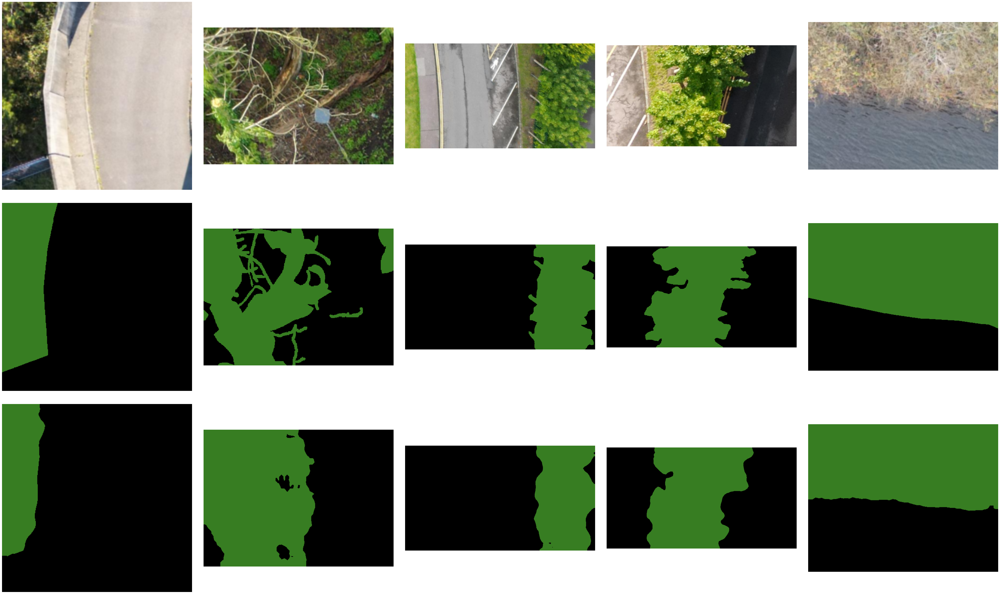

In [ ]:
lst = []
indices = random.sample(range(len(images)), k=5)
lst.extend([images[i] for i in indices])
[mask_to_rgb(anns[i], {1: [55, 125, 34]}) for i in indices]
lst.extend([mask_to_rgb(anns[i], {1: [55, 125, 34]}) for i in indices])
lst.extend([mask_to_rgb(preds[i], {1: [55, 125, 34]}) for i in indices])

show_in_grid(lst, num_rows=3, num_cols=int(len(lst) / 3), show_plot=True)

In [ ]:
# |!cp /content/checkpoints/bestmodel.ckpt /content/drive/MyDrive/UCC-AI-hackathon/checkpoints/

### Calculate the performance of the model from the predictions

In [ ]:
metrics = SMAPIoUMetric()

for ann, pred in zip(anns, preds):
  metrics.process(input={"gt": ann, "pred": pred})

metrics.compute_metrics(metrics.results)

In [ ]:
from torchvision import models

segmentation_models = [name for name in dir(models.segmentation) if not name.startswith('_')]

print(segmentation_models)
